In [1]:
#Importing important libraries
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2 as cv
import numpy as np
from PIL import Image
%matplotlib inline

In [2]:
#loading the haar cascade
haar_cascade = cv.CascadeClassifier('haar_face.xml')

In [15]:
people = ['Chris Evans','Chris Hemsworth','Mark Ruffalo','Robert Downey Jr','Scarlett Johansson']

In [3]:
#chris evans
features = []
labels = []
for i in range(1,102):
  filename = 'chris_evans{}.png'.format(i)
  img_array = cv.imread(filename)
  gray = cv.cvtColor(img_array, cv.COLOR_BGR2GRAY)

  face_rect = haar_cascade.detectMultiScale(gray,scaleFactor = 1.1, minNeighbors = 4)

  for (x,y,w,h) in face_rect:
    faces_roi = gray[y:y+h,x:x+h]
    features.append(faces_roi)
    labels.append(0)

#chris hemsworth
features1 = []
labels1 = []
for i in range(1,100):
  filename = 'chris_hemsworth{}.png'.format(i)
  img_array = cv.imread(filename)
  gray = cv.cvtColor(img_array, cv.COLOR_BGR2GRAY)

  face_rect = haar_cascade.detectMultiScale(gray,scaleFactor = 1.1, minNeighbors = 4)

  for (x,y,w,h) in face_rect:
    faces_roi = gray[y:y+h,x:x+h]
    features1.append(faces_roi)
    labels1.append(1)

#mark ruffalo
features2 = []
labels2 = []
for i in range(1,101):
  filename = 'mark_ruffalo{}.png'.format(i)
  img_array = cv.imread(filename)
  gray = cv.cvtColor(img_array, cv.COLOR_BGR2GRAY)

  face_rect = haar_cascade.detectMultiScale(gray,scaleFactor = 1.1, minNeighbors = 4)

  for (x,y,w,h) in face_rect:
    faces_roi = gray[y:y+h,x:x+h]
    features2.append(faces_roi)
    labels2.append(2)

#robert downey junior
features3 = []
labels3 = []
for i in range(1,101):
  filename = 'robert_downey_jr{}.png'.format(i)
  img_array = cv.imread(filename)
  gray = cv.cvtColor(img_array, cv.COLOR_BGR2GRAY)

  face_rect = haar_cascade.detectMultiScale(gray,scaleFactor = 1.1, minNeighbors = 4)

  for (x,y,w,h) in face_rect:
    faces_roi = gray[y:y+h,x:x+h]
    features3.append(faces_roi)
    labels3.append(3)

#scarlett Johansson
features4 = []
labels4 = []
for i in range(1,101):
  filename = 'scarlett_johansson{}.png'.format(i)
  img_array = cv.imread(filename)
  gray = cv.cvtColor(img_array, cv.COLOR_BGR2GRAY)

  face_rect = haar_cascade.detectMultiScale(gray,scaleFactor = 1.1, minNeighbors = 4)

  for (x,y,w,h) in face_rect:
    faces_roi = gray[y:y+h,x:x+h]
    features4.append(faces_roi)
    labels4.append(4)

In [4]:
feature = []
label = []

print(len(features), len(labels))
print(len(features1), len(labels1))
print(len(features2), len(labels2))
print(len(features3), len(labels3))
print(len(features4), len(labels4))

for i in range(85):
  feature.append(features[i])
  label.append(labels[i])
for i in range(93):
  feature.append(features1[i])
  label.append(labels1[i])
for i in range(94):
  feature.append(features2[i])
  label.append(labels2[i])
for i in range(84):
  feature.append(features3[i])
  label.append(labels3[i])
for i in range(91):
  feature.append(features4[i])
  label.append(labels4[i])

print('length of feature = ',len(feature))
print('length of label = ',len(label))

85 85
93 93
94 94
84 84
91 91
length of feature =  447
length of label =  447


In [5]:
#Preparing the input features for the model
feature = np.array(feature,dtype='object')
label = np.array(label)

In [13]:
face_recognizer = cv.face.LBPHFaceRecognizer_create()
face_recognizer.train(feature,label)

In [24]:
def predict_image(filename):

  img = cv.imread(filename)
  gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
  faces_rect = haar_cascade.detectMultiScale(gray, 1.1, 4)
  for (x,y,w,h) in faces_rect:
    faces_roi = gray[y:y+h,x:x+h]
  label, confidence = face_recognizer.predict(faces_roi)
  print(f'label = {people[label]} with a confidence of {confidence}')
  cv.putText(img, str(people[label]), (20,20), cv.FONT_HERSHEY_COMPLEX, 1.0, (0,255,0), thickness=2)
  cv.rectangle(img, (x,y), (x+w,y+h), (0,255,0), thickness=2)
  
  return img

In [9]:
def show_image(array):
  sh_img = Image.fromarray(array)
  return sh_img

In [33]:
#implementing model
img = predict_image('1.jpg')

label = Chris Hemsworth with a confidence of 97.99423210388163


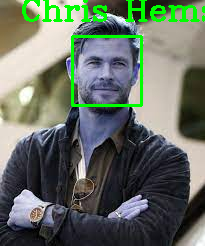

In [34]:
#show the predicted image
show_image(img)

In [35]:
#implementing model
img = predict_image('2.jpg')

label = Mark Ruffalo with a confidence of 12.410993097007262


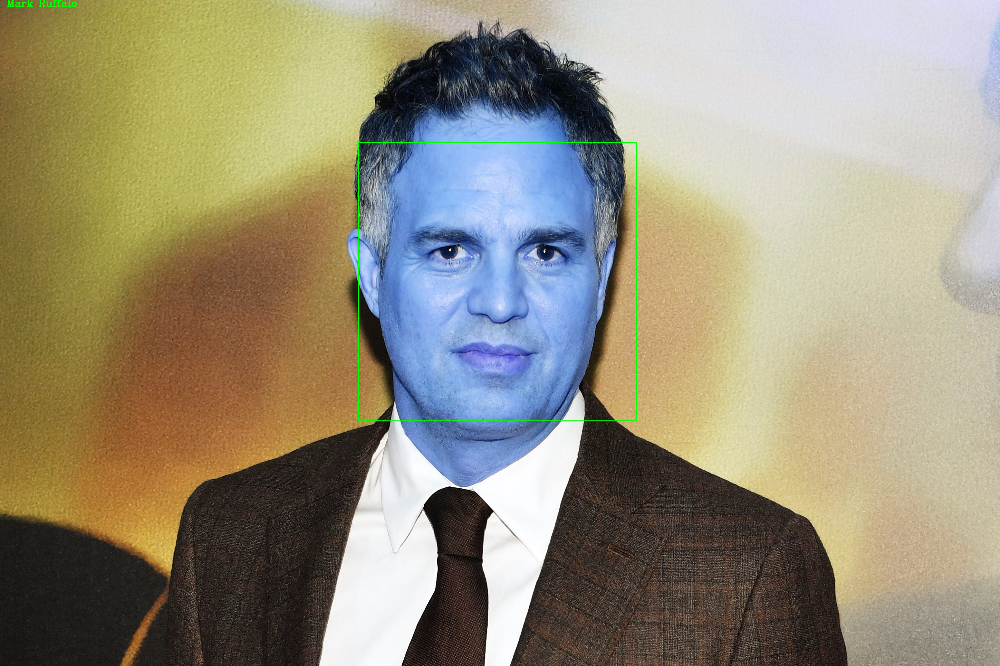

In [36]:
#show the predicted image
show_image(img)

In [37]:
#implementing model
img = predict_image('3.jpg')

label = Robert Downey Jr with a confidence of 89.50198030604034


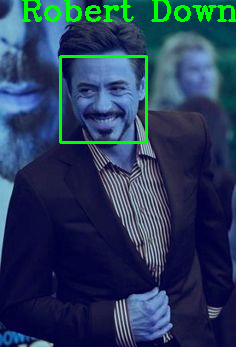

In [38]:
#show the predicted image
show_image(img)

In [39]:
#implementing model
img = predict_image('4.jpg')

label = Scarlett Johansson with a confidence of 38.99681679439328


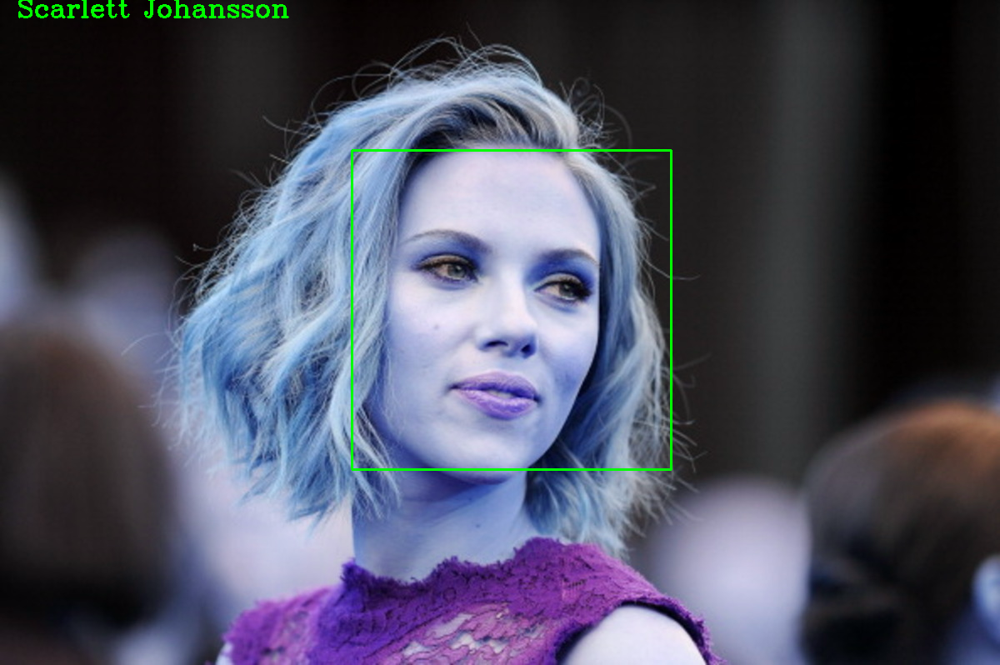

In [40]:
#show the predicted image
show_image(img)

In [41]:
#implementing model
img = predict_image('0.jpg')

label = Chris Hemsworth with a confidence of 43.50319231476992


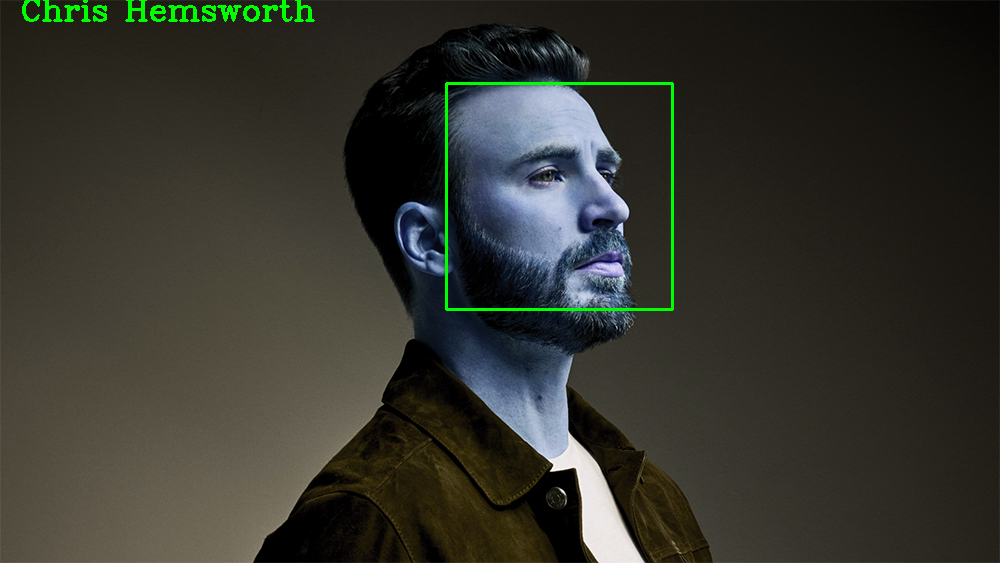

In [42]:
#show the predicted image
show_image(img)

In [27]:
#saving the model
face_recognizer.save('face_trained.h5')

In [28]:
#saving the features
np.save('features.npy',feature)
np.save('labels.npy',label)